In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
flow_file= "./data/PEMS04/PEMS04.npz"
csv_file = "./data/PEMS04/distance.csv"
import pandas as pd
data = np.load(flow_file)
df = pd.read_csv(csv_file)
TS = data['data']
flow = TS[:,:,0]
# flow dict key is the sensor number and the value the traffic flow times serie
flow_dict={k:flow[:,k] for k in range(307)}
# list of the first 10 connected sensor, each sensor traffic flow is contained in PeMS 
sensor = set(df['from'][:5])
PeMS = {str(i):flow_dict[i] for i in sensor}
PeMS = pd.DataFrame(PeMS)
# time serie of sensor k
#creation of the datetime index
start_date = "2018-01-01 00:00:00"
end_date = "2018-02-28 23:55:00"
interval = "5min"
index = pd.date_range(start=start_date, end=end_date, freq=interval)
PeMS = PeMS.set_index(index)

In [2]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Dataset and Model Classes

In [3]:
# Define a PyTorch dataset to generate input/target pairs for the LSTM model
class TimeSeriesDataset(Dataset):
    def __init__(self, data, window_size, stride):
        self.data = data
        self.window_size = window_size
        self.stride = stride

    def __len__(self):
        return len(self.data) - self.window_size

    def __getitem__(self, idx):
        inputs = self.data[idx:idx+self.window_size]
        target = self.data[idx+self.window_size]
        return inputs, target

In [4]:
# Define your LSTM model here with 6 LSTM layers and 1 fully connected layer
class LSTMModel(torch.nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super().__init__()
        self.lstm = torch.nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = torch.nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])
        return out

# Fed UTILS

In [5]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models

import copy
def init_model(n_nodes,main_model):
    return {k:copy.deepcopy(main_model) for k in range(n_nodes)}
    
def send_model(main_model, model_dict, number_of_nodes): #send model to nodes
    with torch.no_grad():
        for i in range(number_of_nodes):
            state_dict= copy.deepcopy(main_model.state_dict())
            model_dict[i].load_state_dict(state_dict)
    return model_dict

def fedavg(main_model, model_dict, number_of_nodes): 
    state_dict = model_dict[0].state_dict()
    for name, param in model_dict[0].named_parameters():
        for i in range(1, number_of_nodes):
            state_dict[name]=  state_dict[name] + model_dict[i].state_dict()[name]
        state_dict[name] = state_dict[name]/number_of_nodes
    new_model = copy.deepcopy(main_model)
    new_model.load_state_dict(state_dict)
    return new_model


In [6]:
#define local dataset for each nodes
def local_dataset(df,nodes=5):
    # Define the sliding window size and stride
    window_size = 7
    stride = 1
    data_dict={}
    for i in range(nodes): 
        # Create datasets and data loaders for training, validation, and test sets
        train_data= pd.DataFrame(df.iloc[:,i][:'2018-02-10 00:00:00'])
        val_data = pd.DataFrame(df.iloc[:,i]['2018-02-10 00:00:00':'2018-02-14 00:00:00'])
        test_data = pd.DataFrame(df.iloc[:,i]['2018-02-14 00:00:00':])

        train_dataset = TimeSeriesDataset(train_data.values, window_size, stride)
        val_dataset = TimeSeriesDataset(val_data.values, window_size, stride)
        test_dataset = TimeSeriesDataset(test_data.values, window_size, stride)
    #Modify the data loaders to move the input data and targets to the GPU device
        train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
        train_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in train_loader]

        val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
        val_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in val_loader]

        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
        test_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in test_loader]
        
        data_dict[i]={'train':train_loader,'val':val_loader,'test':test_loader,'test_data':test_data}
    return data_dict

In [7]:
import torch.cuda
def train_model(model_number,local_model,train_loader, val_loader):
  # Train your model and evaluate on the validation set
    num_epochs = 100
    # Define the loss function and optimizer
    criterion = torch.nn.MSELoss()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    local_model.to(device)
    optimizer = torch.optim.Adam(local_model.parameters(), lr=0.001)
    best_val_loss = float('inf')
    train_losses = []
    valid_losses = []
    for epoch in range(num_epochs):
        train_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = local_model(inputs.float())
            loss = criterion(outputs, targets.float())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            train_losses.append(loss.item())
        val_loss = 0.0
        
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = local_model(inputs.float())
            loss = criterion(outputs, targets.float())
            val_loss += loss.item()            
        val_loss /= len(val_loader)
        valid_losses.append(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(local_model.state_dict(), 'best_model_'+str(model_number)+'.pth')
        print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')
    best_model =  copy.deepcopy(local_model)
    best_model.load_state_dict(torch.load('best_model_'+str(model_number)+'.pth'))
    return best_model

In [8]:
def rmspe(y_true, y_pred):
    EPSILON = 1e-10
    return (np.sqrt(np.mean(np.square((y_true - y_pred) / (y_true + EPSILON))))) * 100

# Local one TS

In [10]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models
data_dict = local_dataset(PeMS)
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)
model_dict = init_model(5,main_model)
for i in range(3,5):
    print('Training node {}'.format(i, round))
    model_dict[i] = train_model(i , model_dict[i] , data_dict[i]['train'] , data_dict[i]['val'])
    print('Done')
    torch.save(model_dict[i].state_dict(), 'local{}.pth'.format(i))

Training node 3
Epoch 1/100, Training Loss: 46614863.9268, Validation Loss: 125018.1161
Epoch 2/100, Training Loss: 43946216.3472, Validation Loss: 118421.7455
Epoch 3/100, Training Loss: 41647081.0540, Validation Loss: 112314.1132
Epoch 4/100, Training Loss: 39496588.8972, Validation Loss: 106568.8745
Epoch 5/100, Training Loss: 37467690.0719, Validation Loss: 101140.0004
Epoch 6/100, Training Loss: 35547917.3647, Validation Loss: 96001.1007
Epoch 7/100, Training Loss: 33729381.4104, Validation Loss: 91133.8998
Epoch 8/100, Training Loss: 32006331.7986, Validation Loss: 86524.4184
Epoch 9/100, Training Loss: 30374252.1598, Validation Loss: 82161.4085
Epoch 10/100, Training Loss: 28829432.7328, Validation Loss: 78035.4290
Epoch 11/100, Training Loss: 27368712.7026, Validation Loss: 74138.2831
Epoch 12/100, Training Loss: 25989319.4631, Validation Loss: 70462.6906
Epoch 13/100, Training Loss: 24688749.4642, Validation Loss: 67001.9638
Epoch 14/100, Training Loss: 23464674.1536, Validati

# Federated Learning

In [9]:
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)

In [10]:
data_dict = local_dataset(PeMS)

In [10]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models

In [20]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)
model_dict = init_model(5,main_model)
for round in range(1,11):
    print('INIT ROUND {} :'.format(round))
    model_dict = send_model(main_model, model_dict, 5)
    for i in range(5):
        print('Training node {} for round {}'.format(i, round))
        model_dict[i] = train_model(i,model_dict[i],data_dict[i]['train'], data_dict[i]['val'])
    print('FedAVG for round {}:'.format(round))
    main_model = fedavg(main_model, model_dict, 5)
    print('Done')
    torch.save(main_model.state_dict(), 'model_round_{}.pth'.format(round))
    


INIT ROUND 1 :
Training node 0 for round 1
Epoch 1/50, Training Loss: 31626956.0615, Validation Loss: 83306.1740
Epoch 2/50, Training Loss: 29371396.6533, Validation Loss: 77646.4563
Epoch 3/50, Training Loss: 27446684.9160, Validation Loss: 72446.6031
Epoch 4/50, Training Loss: 25664262.4291, Validation Loss: 67602.2697
Epoch 5/50, Training Loss: 24000875.5956, Validation Loss: 63071.2311
Epoch 6/50, Training Loss: 22444850.3810, Validation Loss: 58827.7654
Epoch 7/50, Training Loss: 20988391.9802, Validation Loss: 54853.2595
Epoch 8/50, Training Loss: 19625601.1839, Validation Loss: 51133.0962
Epoch 9/50, Training Loss: 18349528.0457, Validation Loss: 47651.4464
Epoch 10/50, Training Loss: 17107245.7059, Validation Loss: 44365.6628
Epoch 11/50, Training Loss: 15949282.1919, Validation Loss: 41292.4278
Epoch 12/50, Training Loss: 14842386.0236, Validation Loss: 38286.3714
Epoch 13/50, Training Loss: 13788362.6596, Validation Loss: 35472.0688
Epoch 14/50, Training Loss: 12797441.1828, 

In [79]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)
main_model.load_state_dict(torch.load('model_round_10.pth'))
model_dict = init_model(5,main_model)
for round in range(1,11):
    print('INIT ROUND {} :'.format(round+10))
    model_dict = send_model(main_model, model_dict, 5)
    for i in range(5):
        print('Training node {} for round {}'.format(i, round+10))
        model_dict[i] = train_model(i,model_dict[i],data_dict[i]['train'], data_dict[i]['val'])
    print('FedAVG for round {}:'.format(round+10))
    main_model = fedavg(main_model, model_dict, 5)
    print('Done')
    torch.save(main_model.state_dict(), 'model_round_{}.pth'.format(round+10))
    


INIT ROUND 11 :
Training node 0 for round 11


# Testing 

## Sensor 5 

In [1]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=0 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,17):
    if k ==16 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('central_{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()



NameError: name 'torch' is not defined

## sensor 263

FOR SENSOR 263
 
Results for ROUND 1 : 
Test MSE Loss: 19399.2805
RMSPE:115.638 % , MAAPE:44.159 %


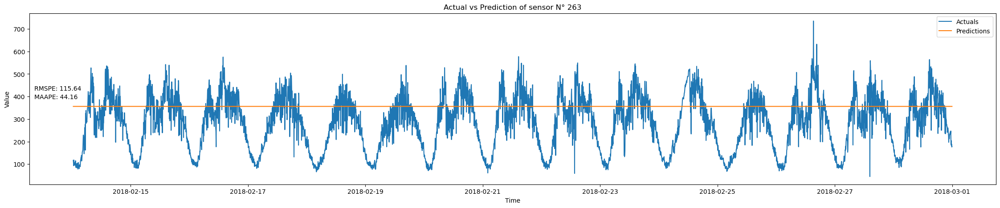

Results for ROUND 2 : 
Test MSE Loss: 8180.8444
RMSPE:54.556 % , MAAPE:31.519 %


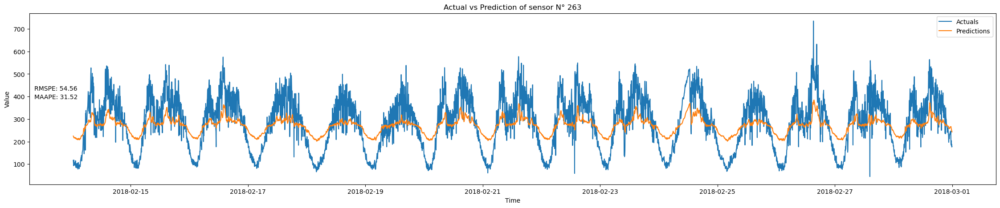

Results for ROUND 3 : 
Test MSE Loss: 15443.9580
RMSPE:78.653 % , MAAPE:45.584 %


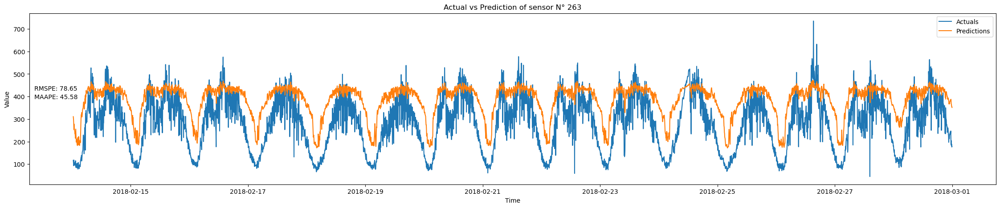

Results for ROUND 4 : 
Test MSE Loss: 2876.5891
RMSPE:23.330 % , MAAPE:15.022 %


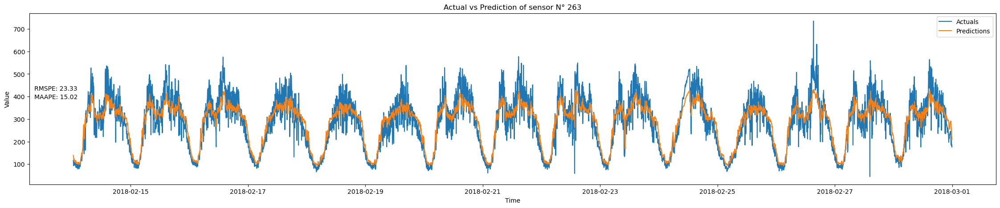

Results for ROUND 5 : 
Test MSE Loss: 2473.3359
RMSPE:21.934 % , MAAPE:12.762 %


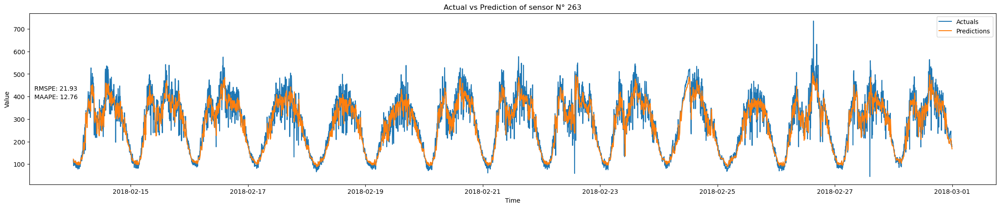

Results for ROUND 6 : 
Test MSE Loss: 2306.8463
RMSPE:21.025 % , MAAPE:11.834 %


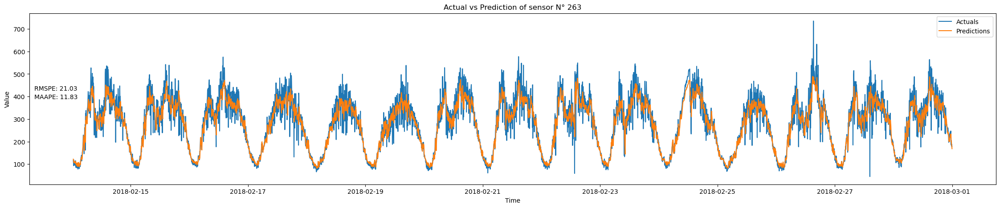

Results for ROUND 7 : 
Test MSE Loss: 2373.9909
RMSPE:20.907 % , MAAPE:11.857 %


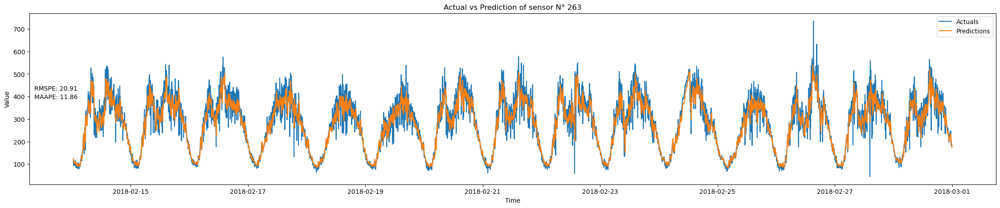

Results for ROUND 8 : 
Test MSE Loss: 2369.9775
RMSPE:21.212 % , MAAPE:11.839 %


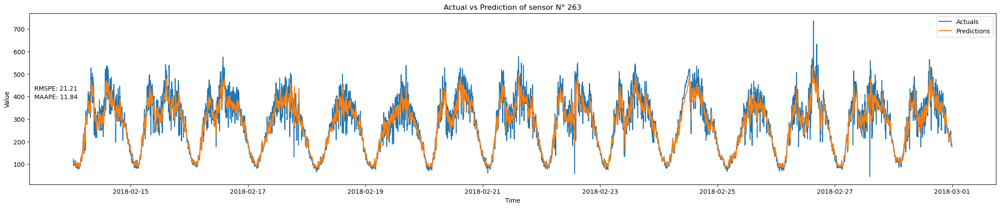

Results for ROUND 9 : 
Test MSE Loss: 2312.8630
RMSPE:21.964 % , MAAPE:11.751 %


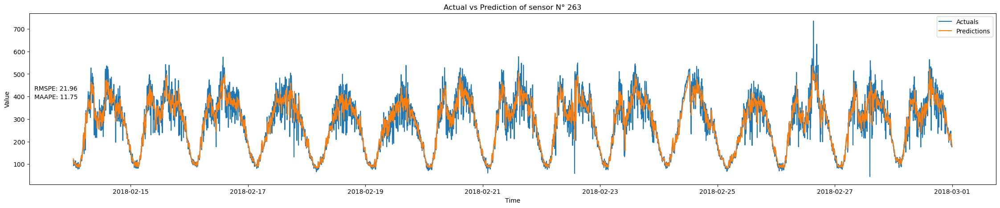

Results for ROUND 10 : 
Test MSE Loss: 2372.6743
RMSPE:22.175 % , MAAPE:11.883 %


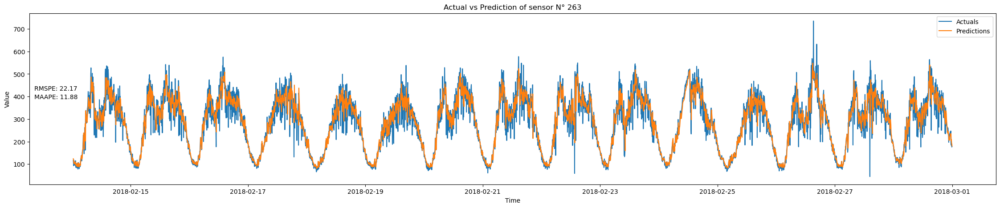

Results for ROUND 11 : 
Test MSE Loss: 2374.8451
RMSPE:22.218 % , MAAPE:11.791 %


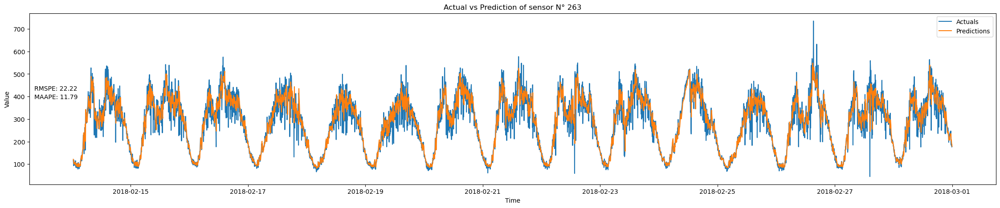

Results for ROUND 12 : 
Test MSE Loss: 2379.1015
RMSPE:21.957 % , MAAPE:11.739 %


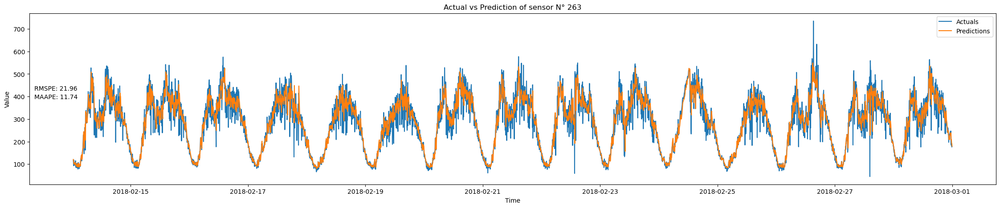

Results for ROUND 13 : 
Test MSE Loss: 2311.9210
RMSPE:21.409 % , MAAPE:11.634 %


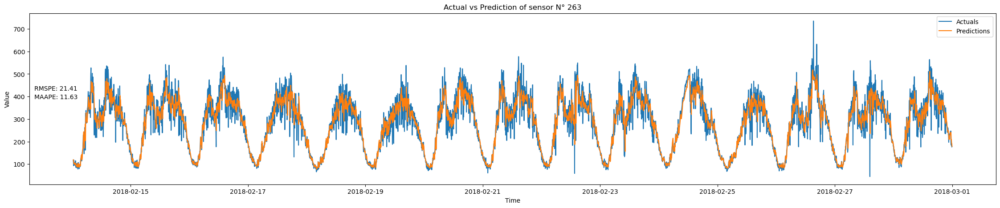

Results for ROUND 14 : 
Test MSE Loss: 2340.5320
RMSPE:21.887 % , MAAPE:11.739 %


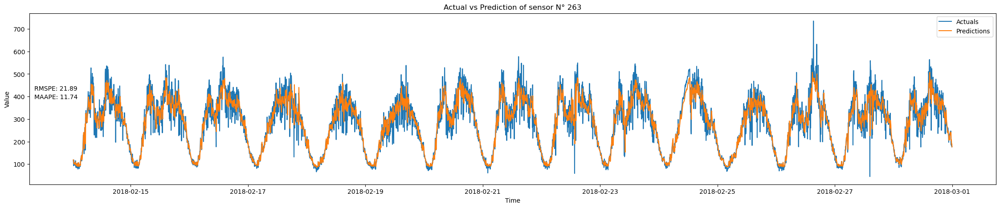

Results for ROUND 15 : 
Test MSE Loss: 2382.7574
RMSPE:22.287 % , MAAPE:11.833 %


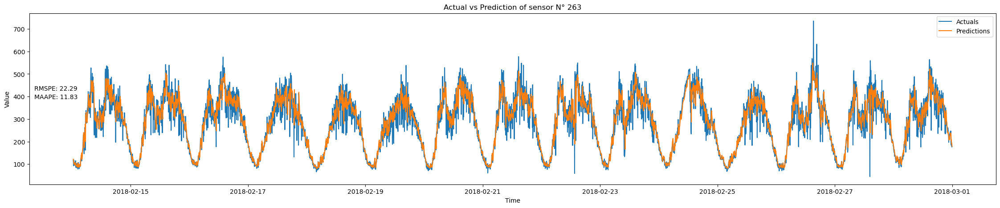

Results for Central Model : 
Test MSE Loss: 3374.2012
RMSPE:22.221 % , MAAPE:13.433 %


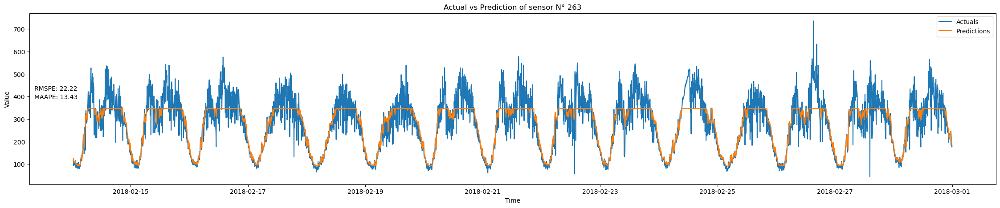

In [ ]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=1 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,17):
    if k ==16 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('central_{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 73

FOR SENSOR 73
 
Results for ROUND 1 : 
Test MSE Loss: 33104.6746
RMSPE:5422790307999.946 % , MAAPE:59.386 %


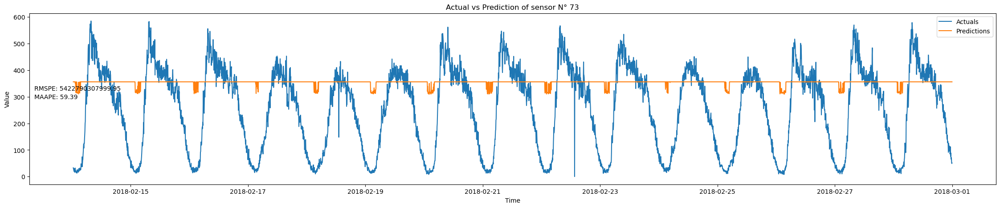

Results for ROUND 2 : 
Test MSE Loss: 10640.1368
RMSPE:4470586846609.429 % , MAAPE:50.799 %


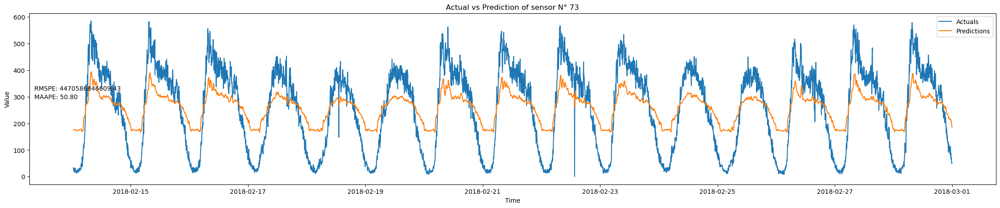

Results for ROUND 3 : 
Test MSE Loss: 11688.8393
RMSPE:6567604985136.140 % , MAAPE:55.855 %


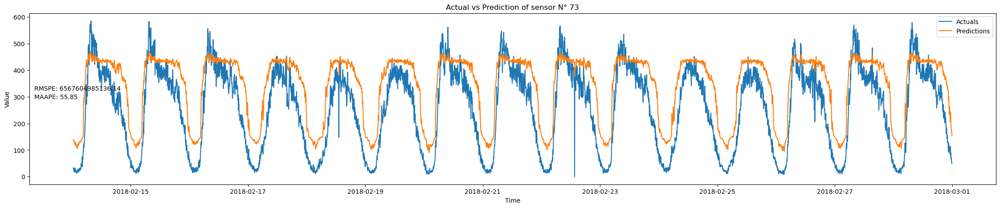

Results for ROUND 4 : 
Test MSE Loss: 2077.3406
RMSPE:5211514823264.680 % , MAAPE:29.657 %


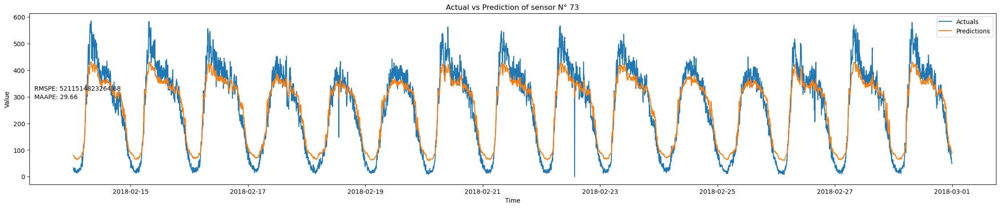

Results for ROUND 5 : 
Test MSE Loss: 1153.3440
RMSPE:5491910301337.314 % , MAAPE:24.318 %


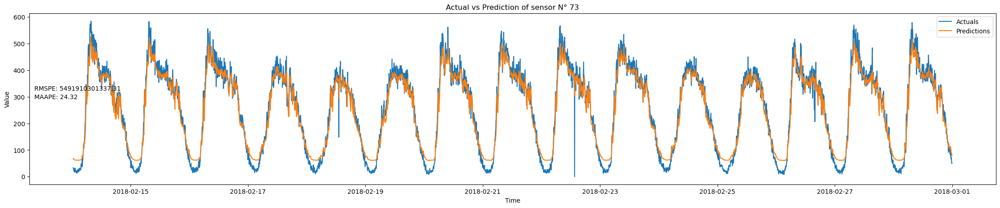

Results for ROUND 6 : 
Test MSE Loss: 4667.3514
RMSPE:5425161361430.815 % , MAAPE:24.730 %


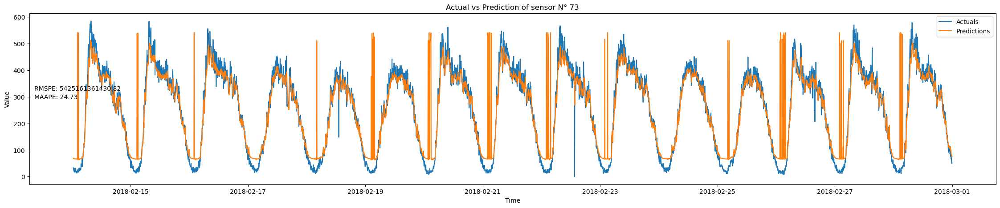

Results for ROUND 7 : 
Test MSE Loss: 7894.8911
RMSPE:5322977923714.123 % , MAAPE:25.191 %


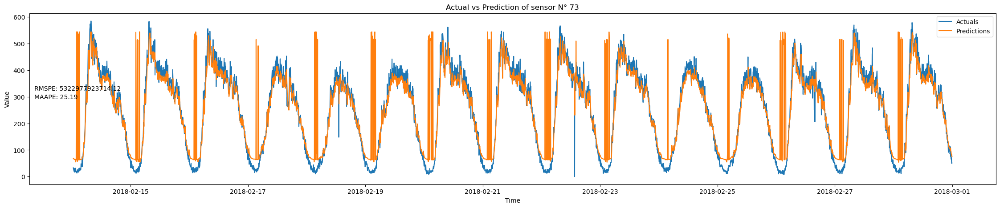

Results for ROUND 8 : 
Test MSE Loss: 7806.9451
RMSPE:5277098579588.187 % , MAAPE:24.513 %


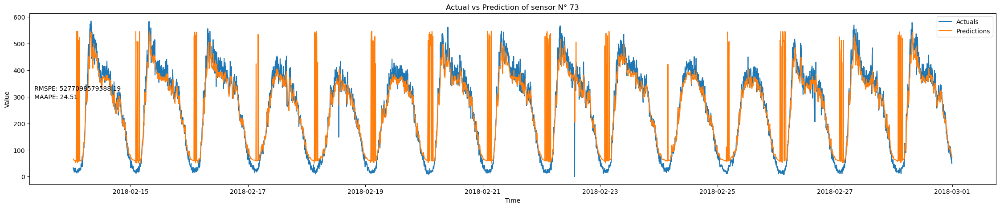

Results for ROUND 9 : 
Test MSE Loss: 2016.3567
RMSPE:5550864258467.795 % , MAAPE:22.394 %


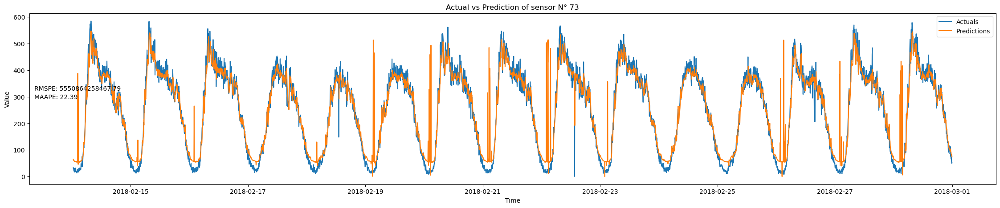

Results for ROUND 10 : 
Test MSE Loss: 954.8027
RMSPE:5560193675761.902 % , MAAPE:21.229 %


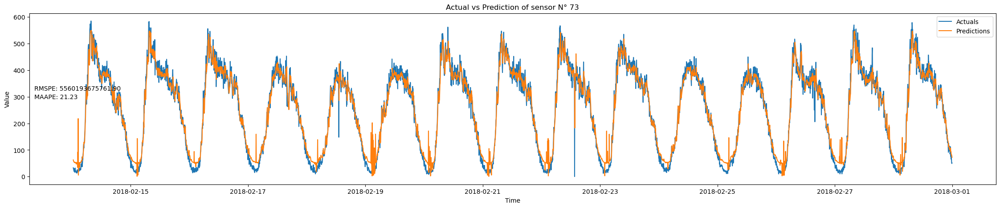

Results for ROUND 11 : 
Test MSE Loss: 876.5709
RMSPE:5570734877621.585 % , MAAPE:21.221 %


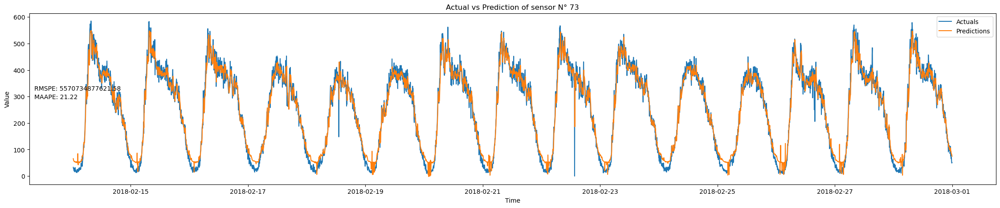

Results for ROUND 12 : 
Test MSE Loss: 911.1623
RMSPE:5520800205910.195 % , MAAPE:20.954 %


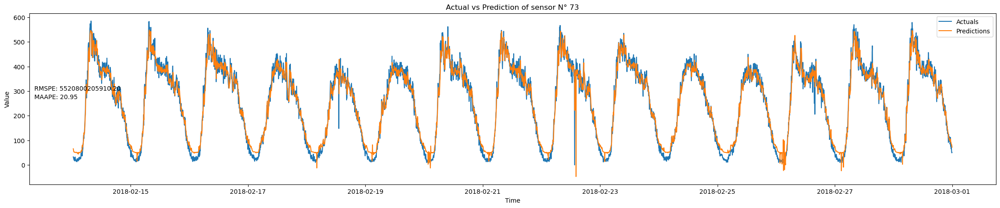

Results for ROUND 13 : 
Test MSE Loss: 837.9047
RMSPE:5481615356235.474 % , MAAPE:19.086 %


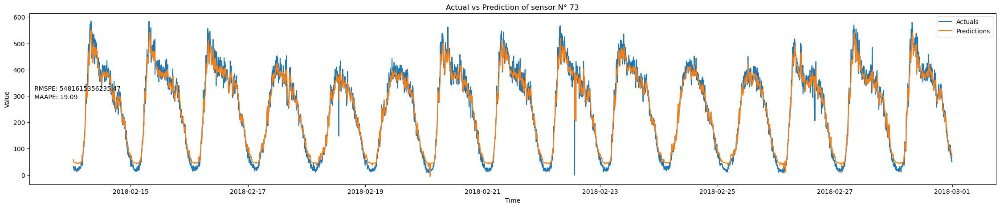

Results for ROUND 14 : 
Test MSE Loss: 1016.9904
RMSPE:5457563710981.420 % , MAAPE:22.386 %


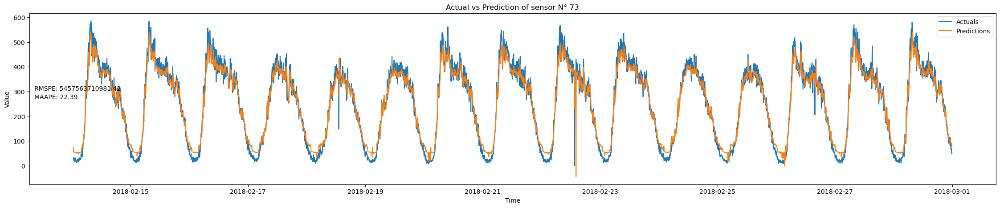

Results for ROUND 15 : 
Test MSE Loss: 792.5370
RMSPE:5552942684487.694 % , MAAPE:18.228 %


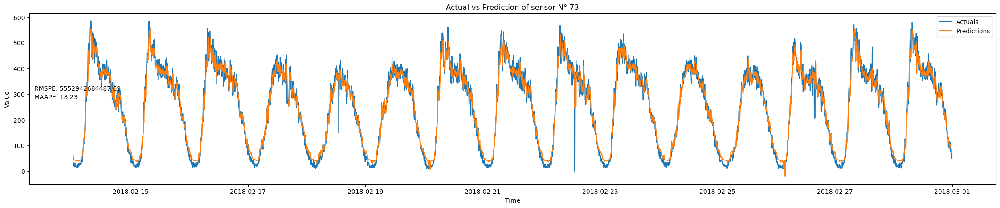

Results for Central Model : 
Test MSE Loss: 2248.5074
RMSPE:5491600619114.085 % , MAAPE:13.102 %


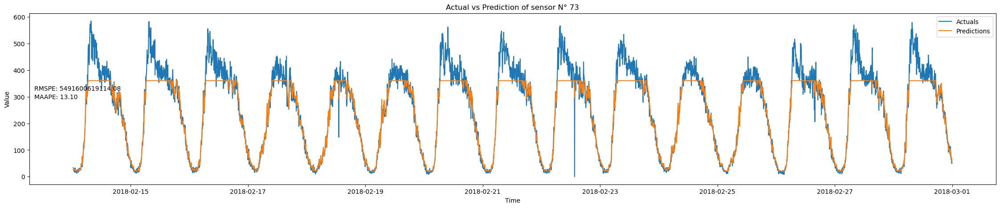

In [ ]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=2 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,17):
    if k ==16 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('central_{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 56

FOR SENSOR 56
 
Results for ROUND 1 : 
Test MSE Loss: 28856.2419
RMSPE:5422790308385.685 % , MAAPE:49.007 %


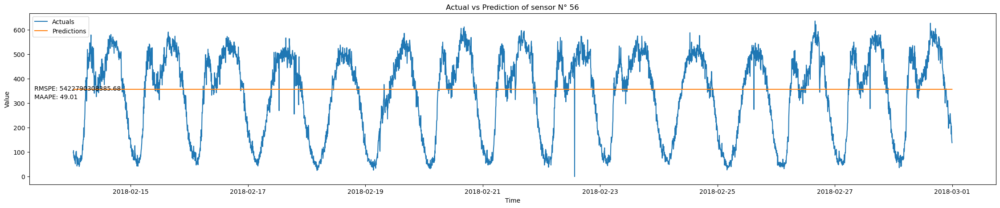

Results for ROUND 2 : 
Test MSE Loss: 13699.1376
RMSPE:5122579351879.844 % , MAAPE:40.553 %


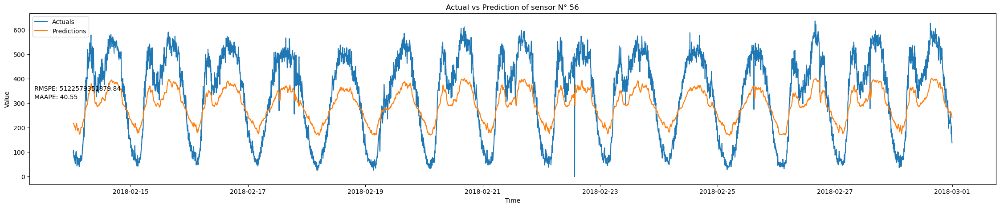

Results for ROUND 3 : 
Test MSE Loss: 10013.9254
RMSPE:6717203430945.732 % , MAAPE:38.665 %


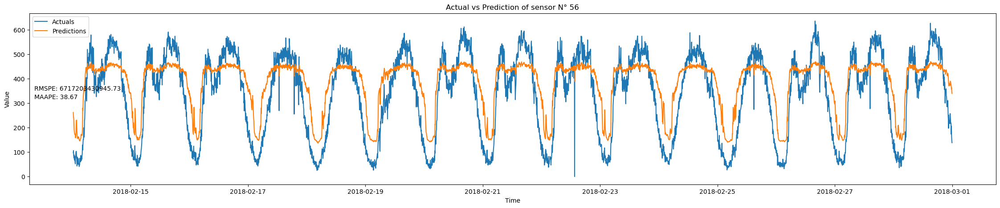

Results for ROUND 4 : 
Test MSE Loss: 4240.8694
RMSPE:6046104961863.919 % , MAAPE:18.867 %


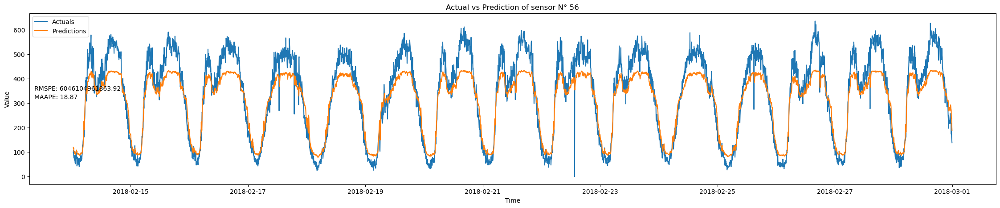

Results for ROUND 5 : 
Test MSE Loss: 1508.0229
RMSPE:6616659855698.766 % , MAAPE:12.337 %


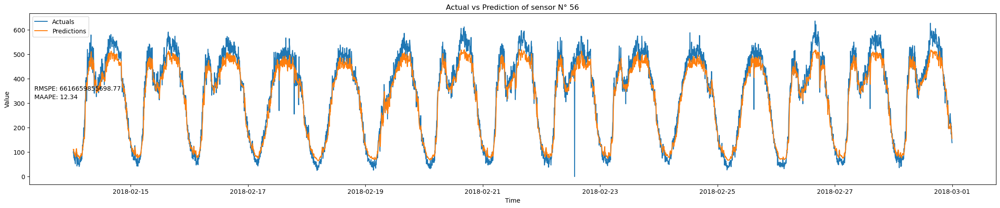

Results for ROUND 6 : 
Test MSE Loss: 1554.3631
RMSPE:6525623156533.646 % , MAAPE:11.673 %


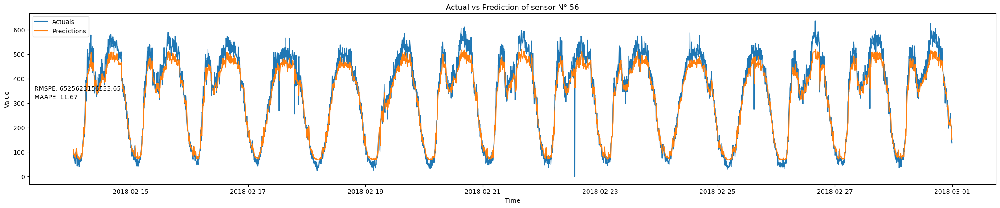

Results for ROUND 7 : 
Test MSE Loss: 1116.3168
RMSPE:6747392683807.536 % , MAAPE:10.855 %


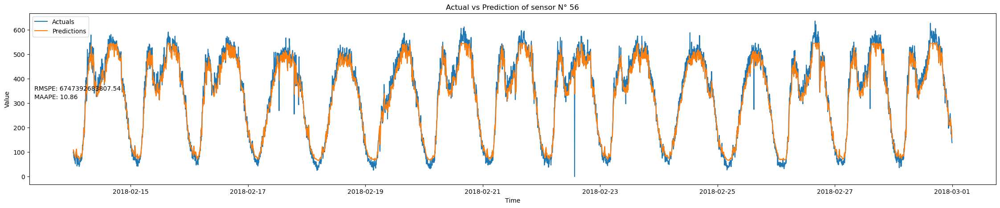

Results for ROUND 8 : 
Test MSE Loss: 1353.5312
RMSPE:6564083035743.004 % , MAAPE:11.201 %


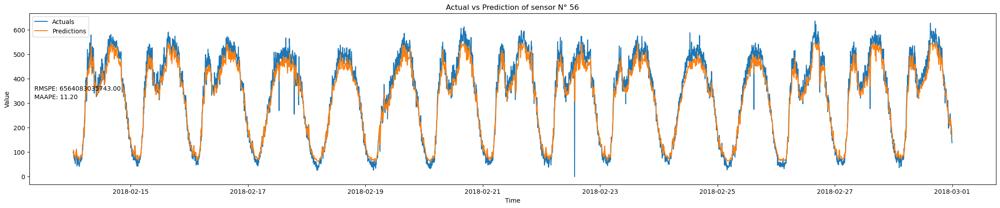

Results for ROUND 9 : 
Test MSE Loss: 1022.4210
RMSPE:6705333911572.091 % , MAAPE:10.334 %


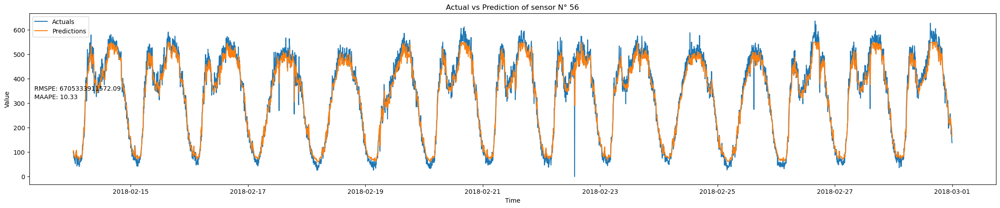

Results for ROUND 10 : 
Test MSE Loss: 919.6225
RMSPE:6863139878895.412 % , MAAPE:10.136 %


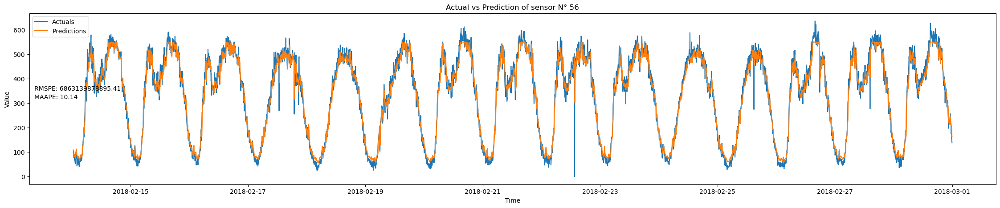

Results for ROUND 11 : 
Test MSE Loss: 931.0289
RMSPE:6811757461136.862 % , MAAPE:10.450 %


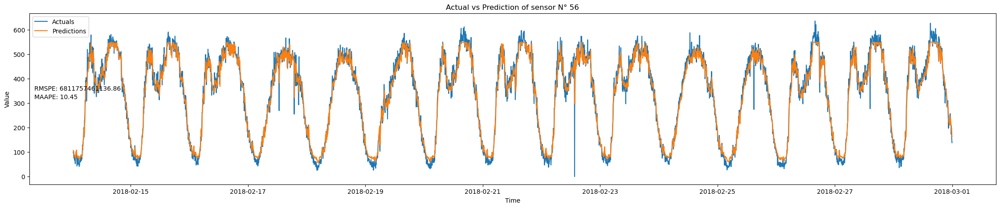

Results for ROUND 12 : 
Test MSE Loss: 1054.6951
RMSPE:6845753059368.251 % , MAAPE:10.471 %


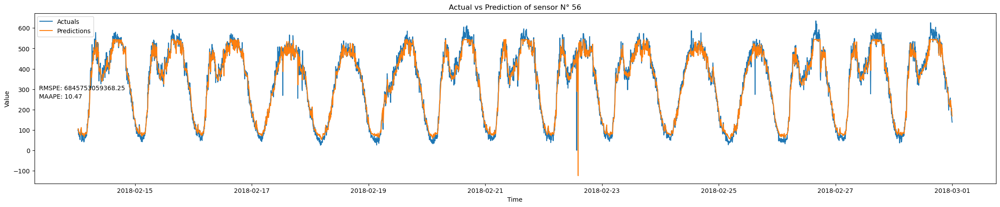

Results for ROUND 13 : 
Test MSE Loss: 1073.7524
RMSPE:6769435696378.979 % , MAAPE:10.099 %


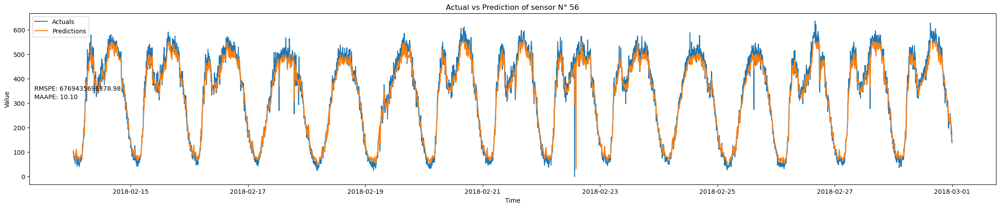

Results for ROUND 14 : 
Test MSE Loss: 1408.8604
RMSPE:6592471188404.688 % , MAAPE:12.071 %


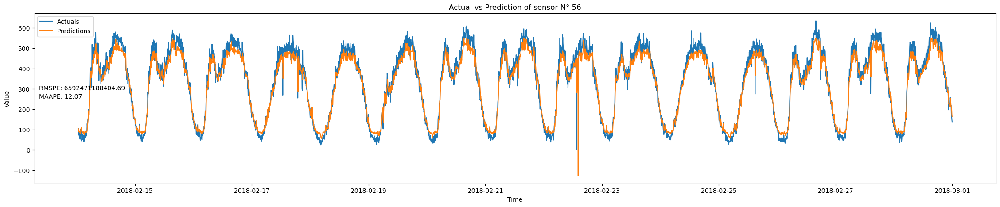

Results for ROUND 15 : 
Test MSE Loss: 947.8475
RMSPE:6887604913807.234 % , MAAPE:9.982 %


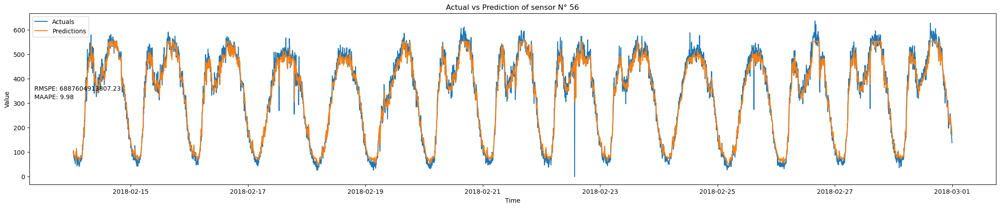

Results for Central Model : 
Test MSE Loss: 4374.5832
RMSPE:6231917563349.874 % , MAAPE:13.214 %


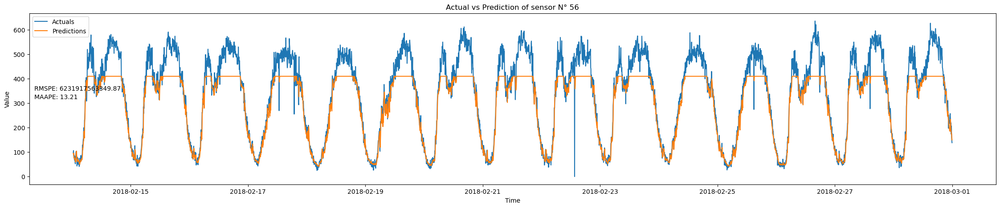

In [ ]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=3 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,17):
    if k ==16 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('central_{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 154

FOR SENSOR 154
 
Results for ROUND 1 : 
Test MSE Loss: 19110.4966
RMSPE:94.211 % , MAAPE:39.558 %


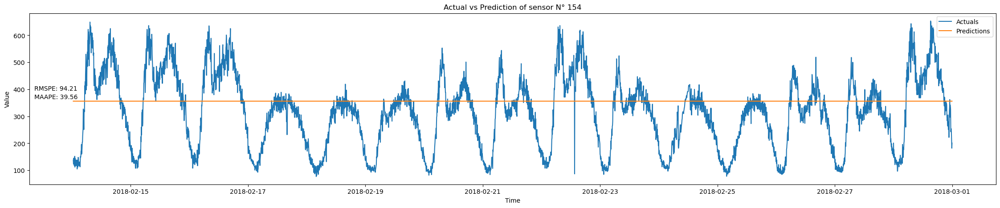

Results for ROUND 2 : 
Test MSE Loss: 8879.0597
RMSPE:44.246 % , MAAPE:28.922 %


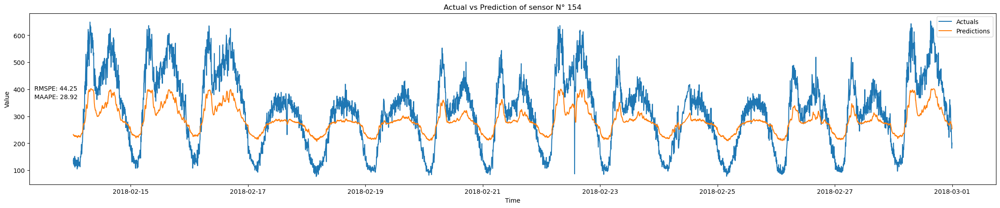

Results for ROUND 3 : 
Test MSE Loss: 14336.8689
RMSPE:72.453 % , MAAPE:40.827 %


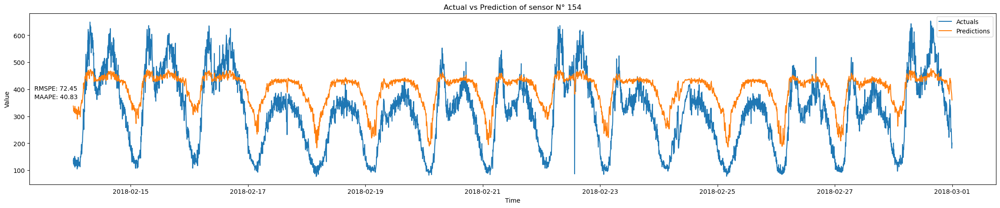

Results for ROUND 4 : 
Test MSE Loss: 2939.3964
RMSPE:16.546 % , MAAPE:12.320 %


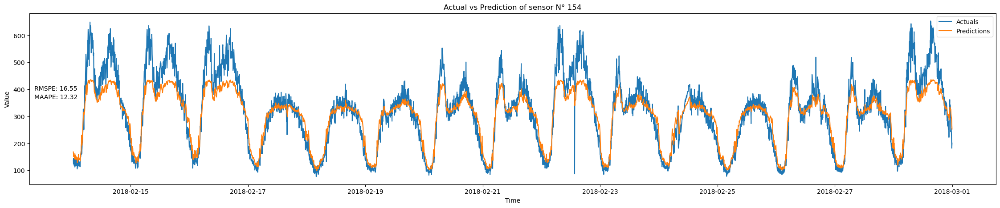

Results for ROUND 5 : 
Test MSE Loss: 1307.7585
RMSPE:12.120 % , MAAPE:8.351 %


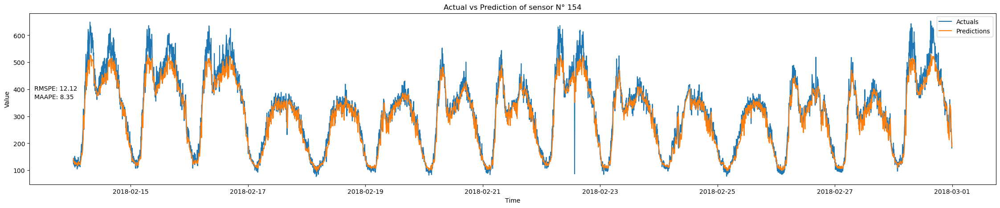

Results for ROUND 6 : 
Test MSE Loss: 1256.4338
RMSPE:11.411 % , MAAPE:7.773 %


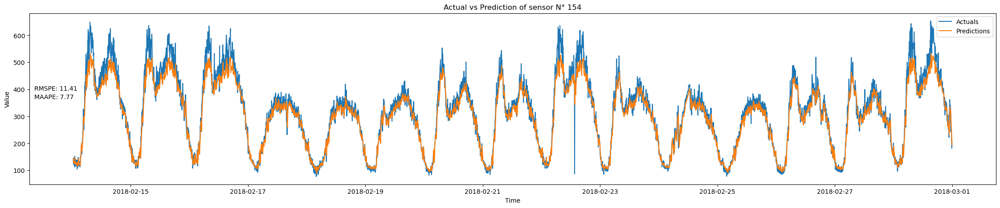

Results for ROUND 7 : 
Test MSE Loss: 1053.8444
RMSPE:11.171 % , MAAPE:7.640 %


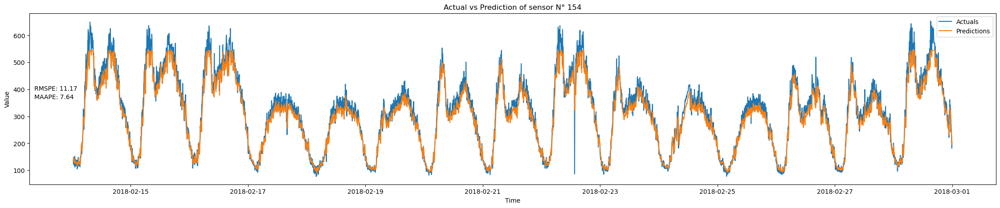

Results for ROUND 8 : 
Test MSE Loss: 1156.4934
RMSPE:11.314 % , MAAPE:7.798 %


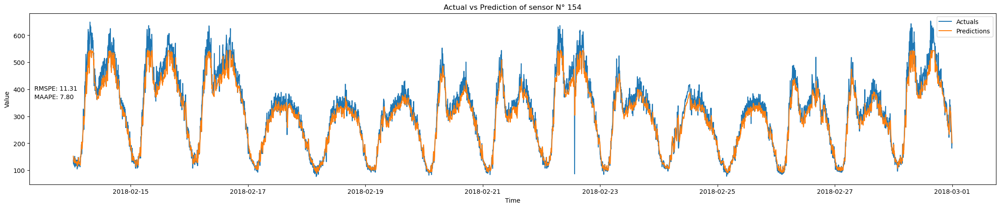

Results for ROUND 9 : 
Test MSE Loss: 895.0045
RMSPE:10.886 % , MAAPE:7.167 %


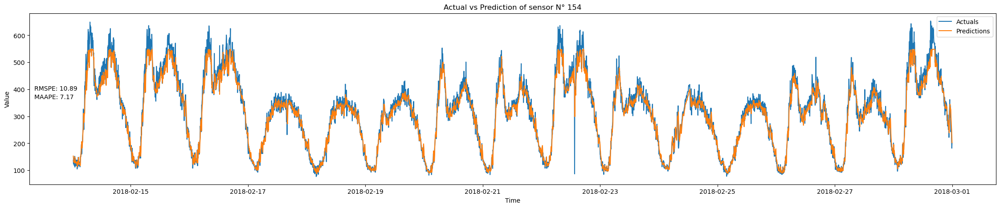

Results for ROUND 10 : 
Test MSE Loss: 823.9482
RMSPE:10.742 % , MAAPE:6.984 %


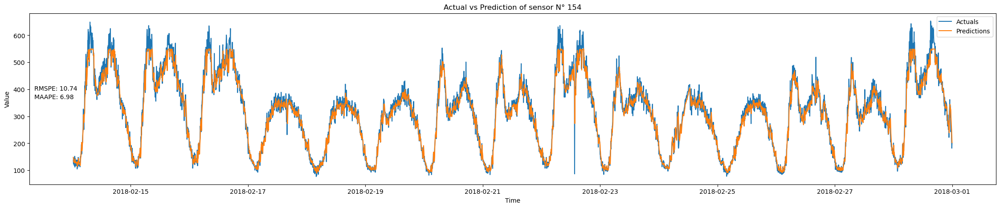

Results for ROUND 11 : 
Test MSE Loss: 835.3322
RMSPE:10.760 % , MAAPE:6.998 %


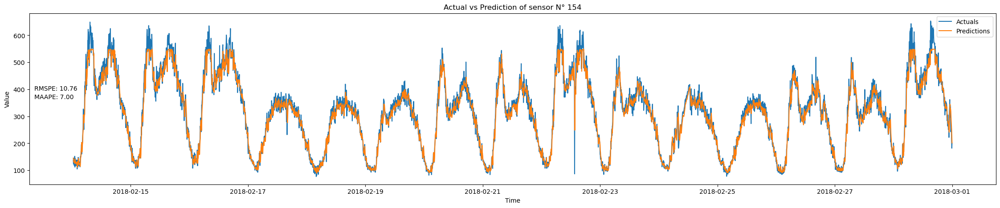

Results for ROUND 12 : 
Test MSE Loss: 871.7785
RMSPE:10.868 % , MAAPE:7.102 %


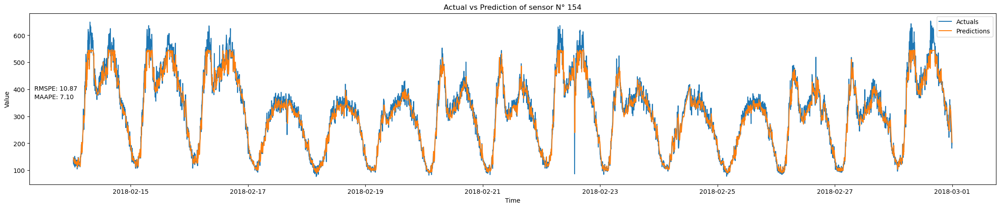

Results for ROUND 13 : 
Test MSE Loss: 915.9716
RMSPE:10.887 % , MAAPE:7.156 %


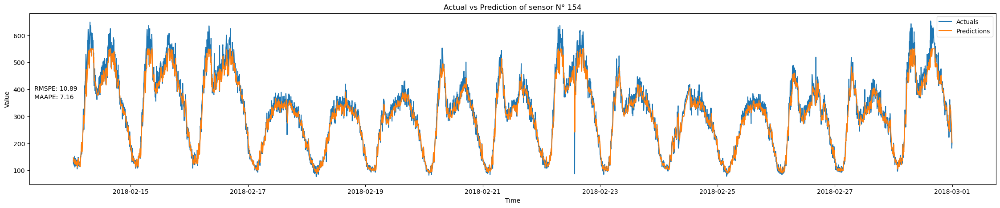

Results for ROUND 14 : 
Test MSE Loss: 1043.1928
RMSPE:10.906 % , MAAPE:7.334 %


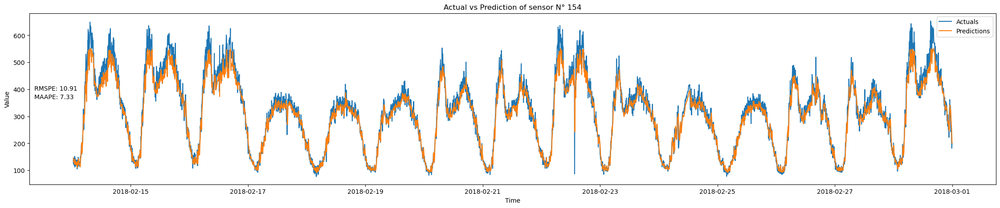

Results for ROUND 15 : 
Test MSE Loss: 854.4396
RMSPE:11.049 % , MAAPE:7.207 %


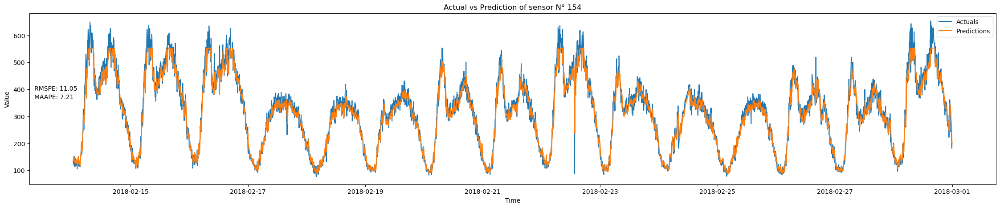

Results for Central Model : 
Test MSE Loss: 17391.0599
RMSPE:77.676 % , MAAPE:37.477 %


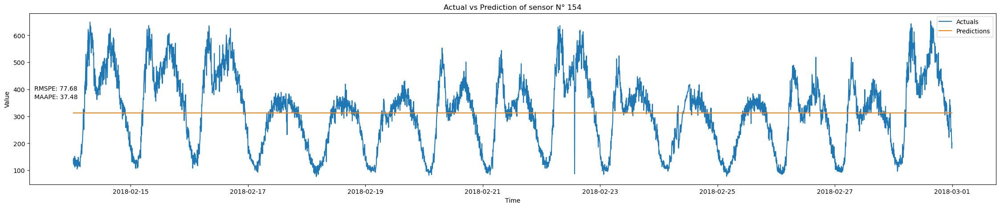

In [ ]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=4 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,17):
    if k ==16 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('central_{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()
